# Описание проекта

Чтобы оптимизировать производственные расходы, металлургический комбинат ООО «Так закаляем сталь» решил уменьшить потребление электроэнергии на этапе обработки стали. Необходимо построить прототип модели, которая предскажет температуру стали в процессе легирования стали. Необходимо предсказать последнею измеренную температуру.

   Сталь обрабатывают в металлическом ковше вместимостью около 100 тонн. Чтобы ковш выдерживал высокие температуры, изнутри его облицовывают огнеупорным кирпичом. Расплавленную сталь заливают в ковш и подогревают до нужной температуры графитовыми электродами. Они установлены в крышке ковша. 

   Из сплава выводится сера (десульфурация), добавлением примесей корректируется химический состав и отбираются пробы. Сталь легируют — изменяют её состав — подавая куски сплава из бункера для сыпучих материалов или проволоку через специальный трайб-аппарат (англ. tribe, «масса»).

   Перед тем как первый раз ввести легирующие добавки, измеряют температуру стали и производят её химический анализ. Потом температуру на несколько минут повышают, добавляют легирующие материалы и продувают сплав инертным газом. Затем его перемешивают и снова проводят измерения. Такой цикл повторяется до достижения целевого химического состава и оптимальной температуры плавки.

Содержание проекта кликабельное
# Содержания проекта
[1. Подготовка данных](#section1)<br>
&nbsp;&nbsp;&nbsp;[1.1 Загрузка данных](#section1)<br>
&nbsp;&nbsp;&nbsp;[1.2 Анализ целевой переменной](#section1.2)<br>
&nbsp;&nbsp;&nbsp;[1.3 Анализ данных в таблице data_arc](#section1.3)<br>
&nbsp;&nbsp;&nbsp;[1.4 Анализ данных в таблице data_gas](#section1.4)<br>
&nbsp;&nbsp;&nbsp;[1.5 Анализ данных в таблице data_bulk](#section1.5)<br>
&nbsp;&nbsp;&nbsp;[1.6 Анализ данных в таблице data_wire](#section1.6)<br>
[2. Обучение модели](#section2)<br>
&nbsp;&nbsp;&nbsp;[2.1 Подготовка данных для обучения](#section2)<br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[2.1.1 Анализ временных меток в таблицах data_temp и data_arc](#section2.1.1)<br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[2.1.2 Подготовка данных в таблице data_temp](#section2.1.2)<br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[2.1.3 Подготовка данных в таблице data_arc](#section2.1.3)<br>
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[2.1.4 Объединение данных](#section2.1.4)<br>
&nbsp;&nbsp;&nbsp;[2.2 Разделение данных на обучение и тест](#section2.2)<br>
&nbsp;&nbsp;&nbsp;[2.3 Линейная регрессия](#section2.3)<br>
&nbsp;&nbsp;&nbsp;[2.4 LightGBM](#section2.4)<br>
&nbsp;&nbsp;&nbsp;[2.5 CatBoostRegressor](#section2.5)<br>
&nbsp;&nbsp;&nbsp;[2.6 Важность признаков](#section2.6)<br>
&nbsp;&nbsp;&nbsp;[2.7 Матрица корреляции и анализ на мультиколинеарность признаков](#section2.7)<br>
&nbsp;&nbsp;&nbsp;[2.8 Анализ моделей](#section2.8)<br>
[3. Отчет по проекту](#section3)<br>


Импорт необходимых библиотек

In [1]:
# импорт необходимых библиотек
import pandas as pd
import numpy as np
# библиотеки алгоритмов машшиного обучения
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_absolute_error as MAE
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV
import lightgbm as lgb
from catboost import CatBoostRegressor
# библиотеки графики
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px
import plotly.figure_factory as ff
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import seaborn as sns
# библиотеки работы с файлами
from pathlib import Path
import os
import requests
# прочее
import warnings
warnings.filterwarnings('ignore')

C:\Anaconda\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



Блок вспомогательных функций

In [2]:
# функции для получения датасета из моего гугл диска
def download_file_from_google_drive(id, destination):
    URL = "https://docs.google.com/uc?export=download"
   

    session = requests.Session()

    response = session.get(URL, params = { 'id' : id }, stream = True)
    token = get_confirm_token(response)

    if token:
        params = { 'id' : id, 'confirm' : token }
        response = session.get(URL, params = params, stream = True)

    save_response_content(response, destination)    

def get_confirm_token(response):
    for key, value in response.cookies.items():
        if key.startswith('download_warning'):
            return value

    return None

def get_file(file_name, url):
    """
    Функция проверяет есть локально файл с данными, если нет скачивает по ссылки из Инета
    Параметры:
    file_name - полный путь к файлу
    url - ссылка из Инета 
    """
    #проверка есть ли файл
    if not os.path.exists(file_name):
        print(file_name,'файл не найден и будет скачен по сети')
        download_file_from_google_drive(url,file_name)

def save_response_content(response, destination):
    CHUNK_SIZE = 32768

    with open(destination, "wb") as f:
        for chunk in response.iter_content(CHUNK_SIZE):
            if chunk: # filter out keep-alive new chunks
                f.write(chunk)



# фукнция для вывода данных и построению графиков
def fearture_analize(data,column,title,bin_size=1):
    """
        Выводит основные статистики переданного параметра, а также строит гистограмму с boxplot.
        Параметры:
        data - датасет
        column - имя колонки 
        title - заголовок
    """
    data = data[data[column].notna()]
    fig = make_subplots(
            rows=2, cols=1,
            shared_xaxes = True,
            x_title = title,
            row_heights=[.2, .8],
            specs=[[{"type": "xy"}],
                   [{"type": "xy"}]])
                   
    fig.add_trace(go.Box(x=data[column],name="",showlegend=False),row=1,col=1)
    distplfig = ff.create_distplot([data[column]], [column], curve_type = 'normal',bin_size=bin_size)
    fig.add_trace(distplfig.data[0],row=2,col=1)
    fig.add_trace(distplfig.data[1],row=2,col=1)
    
    fig.show()
    
def get_group_first_last_count(data,columns):
    '''
    Функция группирует данные по столбцу key, используя в качестве агрегирующих функций
    ['first','last','count']. Возвращает сгруппированную датафрейм с переименноваными колонками.
    Параметры:
    - data - исходный датафрейм
    - columns - список названий колонок
    '''
    data_group = ( 
        data
        .groupby('key')
        .agg(['first','last','count'])
        .reset_index()
        )
    data_group.columns = data_group.columns.droplevel(0)
    data_group.columns = columns
    return data_group

def calc_MAE(model,X_train,y_train,X_test,y_test,df_scores,comment=''):
    '''
    Функция вычисляет МАЕ, выводит на экран МАЕ обучения и теста, сохраняет результат в df_scores
    Параметры:
    - model - обученная модель
    - X_train - обучающий датасет с признаками
    - y_train - таргет на обучающей выборке
    - X_test - датасет с тестовыми признаками
    - y_test - таргет на тестовой выборке
    - df_scores - таблица с метриками
    - comment - комментарий при добавлении строки в таблицу df_scores
    '''
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    mae_train = MAE(y_pred_train,y_train)
    mae_test = MAE(y_pred_test,y_test)
    print('Модель - ', model)
    print('MAE на обучнии = {0:.4f}, MAE на тесте = {1:.4f}' \
      .format(
            mae_train,
            mae_test
            )
         )
    
    return df_scores.append({'comment':comment,'model':model,'MAE_train':mae_train,'MAE_test':mae_test},
                     ignore_index=True)

def plot_feature_impotance(model, columns , title):
    """
        Вывод графика по анализу признаков
        Параметры:
        - model - модель LigthGBM или CatBoost
        - columns - список признаков
        - title - заголовок графика
    """
    feature_imp = pd.DataFrame({'Value':model.feature_importances_,'Feature':columns})
    plt.figure(figsize=(40, 40))
    sns.set(font_scale = 5)
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", 
                                                        ascending=False))
    plt.title(title)
    plt.show()


<a id='section1'></a>
# 1. Подготовка данных

## 1.1 Загрузка данных

In [3]:
# загрузка данных с моего гуглдрайва
Path('datasets').mkdir(parents=True,exist_ok=True)
urls = {
    'data_arc':('datasets/data_arc.csv','1fc9QDZPO6lg7DDU4_ZmcMxrDU6urgZpT'),
    'data_bulk':('datasets/data_bulk.csv','1yJvwEYcG5AjSq8zhE6lvgvxG8YHEcqYn'),
    'data_bulk_time':('datasets/data_bulk_time.csv','1wOsWmyv9wzGJ4l5ewVIyqaHKVd2PlV32'),
    'data_gas':('datasets/data_gas.csv','13bCng5IDZ62FiQmpgwL6Uw-aNYB0-P7w'),
    'data_temp':('datasets/data_temp.csv','1b15Nr_oKbJtYvmD6_-uLO_JmVfy88lOB'),
    'data_wire':('datasets/data_wire.csv','11A48P_fpKFYtmGReuZWMeTgNIQIlwJ4B'),
    'data_wire_time':('datasets/data_wire_time.csv','1Z9TV_2z8JHwMnhZ878gGdtPiocITLRXy'),
}
[get_file(*urls[k]) for k in urls]

[None, None, None, None, None, None, None]

In [4]:
# загрузка данных
#данные об электродах
data_arc = pd.read_csv('datasets/data_arc.csv',parse_dates=['Начало нагрева дугой','Конец нагрева дугой'])
#данные о подаче сыпучих материалов (объём)
data_bulk = pd.read_csv('datasets/data_bulk.csv')
#данные о подаче сыпучих материалов (время)
parse_dates = parse_dates = ['Bulk '+ str(i) for i in range(1,16)]
data_bulk_time = pd.read_csv('datasets/data_bulk_time.csv',parse_dates=parse_dates)
#данные о продувке сплава газом
data_gas = pd.read_csv('datasets/data_gas.csv',names=['key','gas'],header=0)
#результаты измерения температуры
data_temp = pd.read_csv('datasets/data_temp.csv',parse_dates=['Время замера'])
#данные о проволочных материалах (объём)
data_wire = pd.read_csv('datasets/data_wire.csv')
#данные о проволочных материалах (время)
parse_dates = parse_dates = ['Wire '+ str(i) for i in range(1,10)]
data_wire_time = pd.read_csv('datasets/data_wire_time.csv',parse_dates=parse_dates)

<a id='section1.2'></a>
## 1.2 Анализ целевой переменной

In [5]:
data_temp.head(10)

,key,Время замера,Температура
0,1,2019-05-03 11:16:18,1571.0
1,1,2019-05-03 11:25:53,1604.0
2,1,2019-05-03 11:29:11,1618.0
3,1,2019-05-03 11:30:01,1601.0
4,1,2019-05-03 11:30:39,1613.0
5,2,2019-05-03 11:37:27,1581.0
6,2,2019-05-03 11:38:00,1577.0
7,2,2019-05-03 11:49:38,1589.0
8,2,2019-05-03 11:55:50,1604.0
9,2,2019-05-03 11:58:24,1608.0


In [6]:
data_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15907 entries, 0 to 15906
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   key           15907 non-null  int64         
 1   Время замера  15907 non-null  datetime64[ns]
 2   Температура   13006 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 372.9 KB


Удалим записи, в которых нет целевой переменной

In [7]:
data_temp = data_temp.dropna()

Проанализируем распределение температур в данных

In [8]:
fearture_analize(data_temp,'Температура','Распределение температуры')

Проанализируем длинный левый хвост. Для этого отберём данные с температурой меньше 1450 градусов (википедия говорит, что это нижняя температура плавления для стали), посмотрим сколько партий в процессе выплавки имели такую температуру. Для "подозрительных" партий усредним температуру и проверим превышает ли средняя температура 1450. Если средняя температура меньше 1450 - это явный выброс, удалим такие данные.

In [9]:
left_tail_temp = data_temp.query('Температура < 1450')
print('Общее число партий {0}, число партий с аномально низкой температурой {1}'
      .format(
          len(data_temp['key'].unique()),
          len(left_tail_temp['key'].unique()),
             )
     )

Общее число партий 3216, число партий с аномально низкой температурой 6


In [10]:
wrong_key = left_tail_temp['key'].unique()
wrong_data_temp = data_temp.query('key in @wrong_key')
wrong_data_temp = wrong_data_temp.groupby(by='key')['Температура'].mean().sort_values()

In [11]:
wrong_data_temp

key
2561    1204.000000
2052    1518.400000
867     1518.666667
1619    1529.000000
1214    1577.812500
1818    1611.750000
Name: Температура, dtype: float64

In [12]:
data_temp = data_temp[data_temp.key!=2561]
print('Общее число партий {0}'.format(len(data_temp['key'].unique())))

Общее число партий 3215


Вывод:
<br>В таблице с целевой переменной удалили пропуски. Проанализировали распределение температуры в данных. Выявили один выброс для партии с key=2561. Общее число партий для дальнейшего анализа = 3215. Типы данных правильные.

<a id='section1.3'></a>
## 1.3 Анализ данных в таблице data_arc

In [13]:
data_arc.head(10)

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.976059,0.687084
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.805607,0.520285
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.744363,0.498805
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,1.659363,1.062669
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.692755,0.414397
5,2,2019-05-03 11:34:14,2019-05-03 11:36:31,0.438063,0.283043
6,2,2019-05-03 11:38:50,2019-05-03 11:44:28,1.296415,0.892914
7,2,2019-05-03 11:46:19,2019-05-03 11:48:25,0.490377,0.305281
8,2,2019-05-03 11:49:48,2019-05-03 11:53:18,0.827743,0.516874
9,3,2019-05-03 12:06:54,2019-05-03 12:11:34,1.062053,0.671494


In [14]:
data_arc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14876 entries, 0 to 14875
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   key                   14876 non-null  int64         
 1   Начало нагрева дугой  14876 non-null  datetime64[ns]
 2   Конец нагрева дугой   14876 non-null  datetime64[ns]
 3   Активная мощность     14876 non-null  float64       
 4   Реактивная мощность   14876 non-null  float64       
dtypes: datetime64[ns](2), float64(2), int64(1)
memory usage: 581.2 KB


In [15]:
fearture_analize(data_arc,'Активная мощность','Распределение активной мощности',bin_size=0.01)

In [16]:
fearture_analize(data_arc,'Реактивная мощность','Распределение реактивной мощности',bin_size=0.1)

Дополнительно исследуем реактивную мощность, т.к. видим на гистограмме отрицательные значение.

In [17]:
data_arc[data_arc['Реактивная мощность'] <= 0].head()

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
9780,2116,2019-07-24 00:44:48,2019-07-24 00:46:37,0.495782,-715.504924


Исправим отрицательное значение на медиану

In [18]:
data_arc.loc[data_arc.key==2116,'Реактивная мощность'] = data_arc[data_arc.key==2116]['Реактивная мощность'].median()

In [19]:
fearture_analize(data_arc,'Реактивная мощность','Распределение реактивной мощности',bin_size=0.01)

Вывод:
<br>Пропусков в таблице нет. Найдено одно отрицательное значение в реактивной мощности в партии №2116, произвели замену на медианное значение. Типы данных правильные.

<a id='section1.4'></a>
## 1.4 Анализ данных в таблице data_gas

In [20]:
data_gas.head()

,key,gas
0,1,29.749986
1,2,12.555561
2,3,28.554793
3,4,18.841219
4,5,5.413692


In [21]:
data_gas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3239 entries, 0 to 3238
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3239 non-null   int64  
 1   gas     3239 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 50.7 KB


In [22]:
fearture_analize(data_gas,'gas','Распределение Газ',bin_size=1)

Вывод:
<br>Пропусков в таблице нет. Предобработка не требуется. Тип данных правильный.

<a id='section1.5'></a>
## 1.5 Анализ данных в таблице data_bulk

In [23]:
data_bulk.head(10)

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,43.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,150.0,154.0
1,2,NaN,NaN,NaN,73.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,149.0,154.0
2,3,NaN,NaN,NaN,34.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,205.0,NaN,152.0,153.0
3,4,NaN,NaN,NaN,81.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,207.0,NaN,153.0,154.0
4,5,NaN,NaN,NaN,78.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,NaN,151.0,152.0
5,6,NaN,NaN,NaN,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,204.0,NaN,201.0,154.0
6,7,NaN,NaN,NaN,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,204.0,NaN,152.0,154.0
7,8,NaN,NaN,NaN,99.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,410.0,NaN,252.0,153.0
8,9,NaN,NaN,NaN,117.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,107.0,NaN,99.0,203.0
9,10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,NaN,102.0,204.0


In [24]:
data_bulk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   key      3129 non-null   int64  
 1   Bulk 1   252 non-null    float64
 2   Bulk 2   22 non-null     float64
 3   Bulk 3   1298 non-null   float64
 4   Bulk 4   1014 non-null   float64
 5   Bulk 5   77 non-null     float64
 6   Bulk 6   576 non-null    float64
 7   Bulk 7   25 non-null     float64
 8   Bulk 8   1 non-null      float64
 9   Bulk 9   19 non-null     float64
 10  Bulk 10  176 non-null    float64
 11  Bulk 11  177 non-null    float64
 12  Bulk 12  2450 non-null   float64
 13  Bulk 13  18 non-null     float64
 14  Bulk 14  2806 non-null   float64
 15  Bulk 15  2248 non-null   float64
dtypes: float64(15), int64(1)
memory usage: 391.2 KB


In [25]:
data_bulk.describe()

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
count,3129.000000,252.000000,22.000000,1298.000000,1014.000000,77.000000,576.000000,25.000000,1.0,19.000000,176.000000,177.000000,2450.000000,18.000000,2806.000000,2248.000000
mean,1624.383509,39.242063,253.045455,113.879045,104.394477,107.025974,118.925347,305.600000,49.0,76.315789,83.284091,76.819209,260.471020,181.111111,170.284747,160.513345
std,933.337642,18.277654,21.180578,75.483494,48.184126,81.790646,72.057776,191.022904,NaN,21.720581,26.060347,59.655365,120.649269,46.088009,65.868652,51.765319
min,1.000000,10.000000,228.000000,6.000000,12.000000,11.000000,17.000000,47.000000,49.0,63.000000,24.000000,8.000000,53.000000,151.000000,16.000000,1.000000
25%,816.000000,27.000000,242.000000,58.000000,72.000000,70.000000,69.750000,155.000000,49.0,66.000000,64.000000,25.000000,204.000000,153.250000,119.000000,105.000000
50%,1622.000000,31.000000,251.500000,97.500000,102.000000,86.000000,100.000000,298.000000,49.0,68.000000,86.500000,64.000000,208.000000,155.500000,151.000000,160.000000
75%,2431.000000,46.000000,257.750000,152.000000,133.000000,132.000000,157.000000,406.000000,49.0,70.500000,102.000000,106.000000,316.000000,203.500000,205.750000,205.000000
max,3241.000000,185.000000,325.000000,454.000000,281.000000,603.000000,503.000000,772.000000,49.0,147.000000,159.000000,313.000000,1849.000000,305.000000,636.000000,405.000000


Вывод:
<br>Пропуски в таблице вероятно обусловлены тем, что данная легирующая добавка не добавляется в текущий сплав. Пропуски заполним нулями, при обучении линейной регрессии, для бустинга оставим как есть. Типы данных правильные.

<a id='section1.6'></a>
## 1.6 Анализ признака в таблице data_wire

In [26]:
data_wire.head(10)

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,60.059998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,96.052315,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,91.160157,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,89.063515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,89.238236,9.114560,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,6,99.109917,9.114560,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,7,98.061600,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,8,155.282394,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,9,113.393279,9.143681,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,10,81.244796,12.376000,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [27]:
data_wire.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3081 non-null   int64  
 1   Wire 1  3055 non-null   float64
 2   Wire 2  1079 non-null   float64
 3   Wire 3  63 non-null     float64
 4   Wire 4  14 non-null     float64
 5   Wire 5  1 non-null      float64
 6   Wire 6  73 non-null     float64
 7   Wire 7  11 non-null     float64
 8   Wire 8  19 non-null     float64
 9   Wire 9  29 non-null     float64
dtypes: float64(9), int64(1)
memory usage: 240.8 KB


In [28]:
data_wire.describe()

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
count,3081.000000,3055.000000,1079.000000,63.000000,14.000000,1.000,73.000000,11.000000,19.000000,29.000000
mean,1623.426485,100.895853,50.577323,189.482681,57.442842,15.132,48.016974,10.039007,53.625193,34.155752
std,932.996726,42.012518,39.320216,99.513444,28.824667,NaN,33.919845,8.610584,16.881728,19.931616
min,1.000000,1.918800,0.030160,0.144144,24.148801,15.132,0.034320,0.234208,45.076721,4.622800
25%,823.000000,72.115684,20.193680,95.135044,40.807002,15.132,25.053600,6.762756,46.094879,22.058401
50%,1619.000000,100.158234,40.142956,235.194977,45.234282,15.132,42.076324,9.017009,46.279999,30.066399
75%,2434.000000,126.060484,70.227558,276.252014,76.124619,15.132,64.212723,11.886057,48.089603,43.862003
max,3241.000000,330.314424,282.780152,385.008668,113.231044,15.132,180.454575,32.847674,102.762401,90.053604


Вывод:
<br>Пропуски в таблице вероятно обусловлены тем, что данная легирующая добавка не добавляется в текущий сплав. Пропуски заполним нулями, при обучении линейной регрессии, для бустинга оставим как есть. Типы данных правильные.

Из любопытства посмотрим как распределены данные в наиболее популярных добавках, вроде ничего не обычного.

In [29]:
fearture_analize(data_wire,'Wire 1','Распределение Wire 1')

In [30]:
fearture_analize(data_wire,'Wire 2','Распределение Wire 2')

<a id='section2'></a>
# 2. Обучение моделей

<a id='section2.1'></a>
## 2.1 Подготовка данных для обучения

Необходимо объединить данные из разных таблиц, в следующую таблицу:
- temp_last - последняя температура в итерации - целевой признак 
- temp_first - первое измерение темературы
- temp_count - количество раз измерения температуры
- time_temp_interval - интервал времени в сек, между первым и последним измерением
- time_work_arc - время работы электродов (статистики: min, max, sum, median, count)
- time_arc - суммарное время работы электродов 
- active_power - суммарная мощность = время работы электродов в итерации X активную мощность в итерации (статистики: min, max, sum, median, count)
- reactive_power - суммарная мощность = время работы электродов в итерации Х реактивная мощность в итерации (статистики: min, max, sum, median, count)
- [Bulk 1 .... Bulk 15] - суммарное количество сухой смеси 
- [Wire 1 .... Wire 9] - суммарное количество проволки 
- gas - количество поданного газа

Данные таблиц data_bulk_time и data_wire_time игнорируем

In [31]:
# таблица с итоговыми метриками
df_scores = pd.DataFrame(columns=['comment','model','MAE_train','MAE_test'])

<a id='section2.1.1'></a>
## 2.1.1 Анализ временных меток в таблицах data_temp и data_arc

In [32]:
data_temp_time_analize = get_group_first_last_count(
    data=data_temp,
    columns=['key','time_first','time_last','time_count','temp_first','temp_last','temp_count']
)
one_temp_measure = data_temp_time_analize.query('time_count == 1')['key']
print('Количество партий с одним измерением температуры = ', len(one_temp_measure))

Количество партий с одним измерением температуры =  740


In [33]:
data_arc_time_analize = get_group_first_last_count(
    data=data_arc.drop(['Активная мощность','Реактивная мощность'],axis=1),
    columns=['key','time_start_first','time_start_last','time_start_count',
             'time_stop_first','time_stop_last','time_stop_count']
)
data_arc_time_analize.head()

,key,time_start_first,time_start_last,time_start_count,time_stop_first,time_stop_last,time_stop_count
0,1,2019-05-03 11:02:14,2019-05-03 11:26:09,5,2019-05-03 11:06:02,2019-05-03 11:28:37,5
1,2,2019-05-03 11:34:14,2019-05-03 11:49:48,4,2019-05-03 11:36:31,2019-05-03 11:53:18,4
2,3,2019-05-03 12:06:54,2019-05-03 12:31:14,5,2019-05-03 12:11:34,2019-05-03 12:32:19,5
3,4,2019-05-03 12:39:37,2019-05-03 12:53:12,4,2019-05-03 12:43:04,2019-05-03 12:57:50,4
4,5,2019-05-03 13:11:13,2019-05-03 13:32:44,4,2019-05-03 13:15:24,2019-05-03 13:33:55,4


Объединим две таблицы, чтобы получить целевую переменную и первое измерение температуры

In [34]:
data_time_analize = data_temp_time_analize.merge(data_arc_time_analize, on='key')
print('Размер объединенной таблицы ', data_time_analize.shape)
data_time_analize.head()

Размер объединенной таблицы  (3213, 13)


,key,time_first,time_last,time_count,temp_first,temp_last,temp_count,time_start_first,time_start_last,time_start_count,time_stop_first,time_stop_last,time_stop_count
0,1,2019-05-03 11:16:18,2019-05-03 11:30:39,5,1571.0,1613.0,5,2019-05-03 11:02:14,2019-05-03 11:26:09,5,2019-05-03 11:06:02,2019-05-03 11:28:37,5
1,2,2019-05-03 11:37:27,2019-05-03 11:59:12,6,1581.0,1602.0,6,2019-05-03 11:34:14,2019-05-03 11:49:48,4,2019-05-03 11:36:31,2019-05-03 11:53:18,4
2,3,2019-05-03 12:13:17,2019-05-03 12:34:57,5,1596.0,1599.0,5,2019-05-03 12:06:54,2019-05-03 12:31:14,5,2019-05-03 12:11:34,2019-05-03 12:32:19,5
3,4,2019-05-03 12:52:57,2019-05-03 12:59:25,3,1601.0,1625.0,3,2019-05-03 12:39:37,2019-05-03 12:53:12,4,2019-05-03 12:43:04,2019-05-03 12:57:50,4
4,5,2019-05-03 13:23:19,2019-05-03 13:36:01,2,1576.0,1602.0,2,2019-05-03 13:11:13,2019-05-03 13:32:44,4,2019-05-03 13:15:24,2019-05-03 13:33:55,4


Проверим, когда производились измерения температуры в партиях, у которых было только одно измерение температуры.

In [35]:
print('Количество одиночных партий, в которых измерения производились корректно',
    data_time_analize.query('key in @one_temp_measure and time_last > time_stop_last').shape[0])

Количество одиночных партий, в которых измерения производились корректно 7


Найдем партии, в которых последнее измерение температуры было ДО выключения электродов, т.е. партии, в которых нет целевой переменной

In [36]:
wrong_batch_steel = data_time_analize.query('time_last < time_stop_last')['key']
print('Количество партий с отсутствующей целевой переменной -', len(wrong_batch_steel))

Количество партий с отсутствующей целевой переменной - 862


Теперь проверим, а что же с первым измерением температуры, которое по условию задачи, должно проводиться до первого включения электродов

In [37]:
wrong_first_temp = data_time_analize.query('time_first > time_start_first')
print('Количество партий с неправильной (отсутствующей) первой температурой -', len(wrong_first_temp))

Количество партий с неправильной (отсутствующей) первой температурой - 3162


Выводы:

Фиксируем следующие проблемы в данных, выявленные при анализе временных меток:
1. В таблице data_temp 740 записей с одним измерением температуры для партии, из них только у 7 партий температура измерялась после последнего выключения электродов. Остальные измерения проведены либо в промежутках между итерациями, либо до начала нагрева. 
2. Также в данных обнаружились партии (862 штуки), в которых время последнего измерения температуры (целевая) меньше времени последнего выключения электрода, т.е. это не целевая переменная.
3. Практически у всех партий (3126) время первого измерения температуры больше времени первого включения электродов. 

Возможно есть проблемы со сбором данных, в части измерения температуры и/или временных меток. 

По согласованию с тимлидом, были приняты следующие решения:
1. Партии с одним измерением температуры - выбрасываем.
2. Будем игнорировать привязки ко времени измерения температуры и включения электродов. Считаем первое измерение - первым, а последнее - последним. Без учета времени включения электродов.

<a id='section2.1.2'></a>
## 2.1.2 Подготовка данных в таблице data_temp

In [38]:
data_temp_group = get_group_first_last_count(
    data=data_temp,
    columns=['key','time_first','time_last','time_count','temp_first','temp_last','temp_count']
)
data_temp_group.shape

(3215, 7)

По согласованию с тимлидиом удалим партии, в которых только одно измерение температуры

In [39]:
data_temp_group = data_temp_group.query('time_count > 1')

Добавим интервал времени в секундах между измерениями и удалим лишние колонки

In [40]:
data_temp_group['time_temp_interval'] = (
    (data_temp_group['time_last'] - data_temp_group['time_first']).dt.seconds
                                        )
data_temp_group = data_temp_group.drop(['time_first','time_last','time_count'],axis=1)

In [41]:
print('Размер сгруппированной таблицы data_temp ',data_temp_group.shape)
data_temp_group.head()

Размер сгруппированной таблицы data_temp  (2475, 5)


,key,temp_first,temp_last,temp_count,time_temp_interval
0,1,1571.0,1613.0,5,861
1,2,1581.0,1602.0,6,1305
2,3,1596.0,1599.0,5,1300
3,4,1601.0,1625.0,3,388
4,5,1576.0,1602.0,2,762


In [42]:
data_temp_group.describe()

,key,temp_first,temp_last,temp_count,time_temp_interval
count,2475.000000,2475.000000,2475.000000,2475.000000,2475.000000
mean,1250.787071,1588.402020,1595.336162,4.955556,1854.953939
std,719.787271,29.243044,16.023153,1.807323,1301.241764
min,1.000000,1191.000000,1541.000000,2.000000,234.000000
25%,629.500000,1572.000000,1587.000000,4.000000,1182.500000
50%,1252.000000,1588.000000,1593.000000,5.000000,1593.000000
75%,1872.500000,1605.000000,1599.000000,6.000000,2262.500000
max,2499.000000,1679.000000,1700.000000,16.000000,23537.000000


<a id='section2.1.3'></a>
## 2.1.3 Подготовка данных в таблице data_arc

In [43]:
#расчетае мощности
data_arc['time_work_arc'] = (data_arc['Конец нагрева дугой'] - data_arc['Начало нагрева дугой']).dt.seconds
data_arc['active_power'] = data_arc['time_work_arc'] *  data_arc['Активная мощность']
data_arc['reactive_power'] = data_arc['time_work_arc'] *  data_arc['Реактивная мощность']
# удалим уже не нужные колонки
data_arc = data_arc.drop(['Начало нагрева дугой','Конец нагрева дугой','Активная мощность','Реактивная мощность'],axis=1)

In [44]:
agg_func = ['min','max','sum','median','count']
data_arc_group = ( 
        data_arc
        .groupby(by='key')
        .agg(agg_func)
        .reset_index()
        )
data_arc_group.columns = data_arc_group.columns.droplevel(0)
# сгенерим понятные имена столбцов
new_columns = ['key']
for col in data_arc.columns:
    if col=='key': continue
    for f in agg_func:
        new_columns.append(col + '_' + f)
data_arc_group.columns = new_columns
# удалим столбцы с дублирующей информацией
data_arc_group = data_arc_group.drop(['active_power_count','reactive_power_count'],axis=1)
print('Размер сгруппированной таблицы data_arc ',data_arc_group.shape)
data_arc_group.head()

Размер сгруппированной таблицы data_arc  (3214, 14)


,key,time_work_arc_min,time_work_arc_max,time_work_arc_sum,time_work_arc_median,time_work_arc_count,active_power_min,active_power_max,active_power_sum,active_power_median,reactive_power_min,reactive_power_max,reactive_power_sum,reactive_power_median
0,1,148,365,1098,185.0,5,102.527702,605.667332,1207.804249,149.037310,61.330791,387.874330,787.907510,96.252771
1,2,126,338,811,173.5,4,60.014678,438.188301,733.816470,117.806746,38.465411,301.804820,487.590677,73.660223
2,3,65,280,655,109.0,5,16.268194,297.374822,443.583327,46.799646,10.133593,188.018372,280.936835,29.623417
3,4,99,278,741,182.0,4,42.143551,339.425494,670.663327,144.547141,26.579756,209.811788,429.935932,96.772194
4,5,71,415,869,191.5,4,18.989414,672.990827,997.496095,152.757927,12.921419,434.826934,664.940090,108.595868


In [45]:
data_arc_group.describe()

,key,time_work_arc_min,time_work_arc_max,time_work_arc_sum,time_work_arc_median,time_work_arc_count,active_power_min,active_power_max,active_power_sum,active_power_median,reactive_power_min,reactive_power_max,reactive_power_sum,reactive_power_median
count,3214.000000,3214.000000,3214.000000,3214.000000,3214.000000,3214.000000,3214.000000,3214.000000,3214.000000,3214.000000,3214.000000,3214.000000,3214.000000,3214.000000
mean,1623.061294,88.982265,288.464219,794.579029,158.096920,4.628500,35.639453,374.689145,713.398665,109.337315,26.537390,285.024005,535.055460,80.696754
std,934.739859,38.607935,109.670010,332.448622,46.068181,1.608647,31.449378,317.174585,515.858027,74.508388,23.904798,239.541080,385.781123,54.336543
min,1.000000,11.000000,57.000000,57.000000,43.000000,1.000000,0.330021,10.614857,10.614857,5.763346,0.228869,9.155172,10.127814,3.711620
25%,817.250000,62.000000,208.000000,571.000000,126.000000,4.000000,14.635819,163.194500,354.600598,59.060144,10.506418,126.659199,268.190406,43.848301
50%,1623.500000,82.000000,273.000000,770.000000,153.000000,4.000000,26.315828,287.808527,605.935082,89.709921,19.500193,219.194368,453.661003,66.927711
75%,2431.750000,117.000000,342.000000,983.000000,184.500000,6.000000,50.682333,461.556881,927.585275,138.137302,37.660812,353.186763,694.357291,102.671031
max,3241.000000,307.000000,907.000000,4189.000000,421.000000,16.000000,320.685872,3384.557674,8624.443403,930.071406,259.590863,2427.483506,6210.257223,577.435955


<a id='section2.1.4'></a>
## 2.1.4 Объединение данных

Главная таблица data_temp_group - к ней левым соединением добавляем остальные таблицы, по ключу key. Итоговое число строк не должно превышать количество строк в таблице data_temp_group

In [46]:
data_all = (
        data_temp_group
        .merge(data_arc_group,how='left',on='key')
        .merge(data_gas,how='left',on='key')
        .merge(data_bulk,how='left',on='key')
        .merge(data_wire,how='left',on='key')
        )

In [47]:
print('Количество строк в объдиненном датасете {0}, количество строк в таблице data_temp_group {1}' \
      .format(data_all.shape[0],data_temp_group.shape[0]))

Количество строк в объдиненном датасете 2475, количество строк в таблице data_temp_group 2475


In [48]:
# удалим столбец с номером партии, он нам больше не понадобится
data_all = data_all.drop('key',axis=1)

In [49]:
data_all.head()

,temp_first,temp_last,temp_count,time_temp_interval,time_work_arc_min,time_work_arc_max,time_work_arc_sum,time_work_arc_median,time_work_arc_count,active_power_min,...,Bulk 15,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1571.0,1613.0,5,861,148,365,1098,185.0,5,102.527702,...,154.0,60.059998,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1581.0,1602.0,6,1305,126,338,811,173.5,4,60.014678,...,154.0,96.052315,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1596.0,1599.0,5,1300,65,280,655,109.0,5,16.268194,...,153.0,91.160157,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1601.0,1625.0,3,388,99,278,741,182.0,4,42.143551,...,154.0,89.063515,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1576.0,1602.0,2,762,71,415,869,191.5,4,18.989414,...,152.0,89.238236,9.11456,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [50]:
data_all.describe()

,temp_first,temp_last,temp_count,time_temp_interval,time_work_arc_min,time_work_arc_max,time_work_arc_sum,time_work_arc_median,time_work_arc_count,active_power_min,...,Bulk 15,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
count,2475.000000,2475.000000,2475.000000,2475.000000,2475.000000,2475.000000,2475.000000,2475.000000,2475.000000,2475.000000,...,1713.000000,2348.000000,833.000000,39.000000,12.000000,0.0,45.000000,4.000000,13.000000,28.000000
mean,1588.402020,1595.336162,4.955556,1854.953939,90.041212,290.684444,799.951919,158.032525,4.625859,36.390792,...,164.323993,103.309767,50.846731,193.182538,59.496235,NaN,50.659374,3.703414,55.772561,35.098700
std,29.243044,16.023153,1.807323,1301.241764,38.562110,108.901427,340.784276,46.023335,1.610087,31.853805,...,50.033956,42.614516,40.050640,100.867783,30.804638,NaN,37.743040,3.818433,20.235591,19.627598
min,1191.000000,1541.000000,2.000000,234.000000,11.000000,57.000000,57.000000,43.000000,1.000000,0.330021,...,1.000000,1.918800,0.030160,0.144144,24.148801,NaN,0.137280,0.234208,45.076721,4.622800
25%,1572.000000,1587.000000,4.000000,1182.500000,63.000000,212.000000,573.000000,126.000000,4.000000,15.170467,...,105.000000,74.212324,20.207199,93.189102,38.347402,NaN,25.053600,0.849004,46.002319,23.177700
50%,1588.000000,1593.000000,5.000000,1593.000000,84.000000,278.000000,772.000000,153.000000,4.000000,27.196338,...,199.000000,102.030235,40.112801,236.972740,49.661561,NaN,40.085762,3.044704,46.187439,30.084599
75%,1605.000000,1599.000000,6.000000,2262.500000,118.000000,342.000000,986.500000,185.000000,6.000000,51.024922,...,205.000000,128.945694,70.062721,277.068801,84.755579,NaN,65.036400,5.899114,46.279999,44.944904
max,1679.000000,1700.000000,16.000000,23537.000000,307.000000,907.000000,4189.000000,421.000000,16.000000,320.685872,...,405.000000,330.314424,282.780152,385.008668,113.231044,NaN,180.454575,8.490040,102.762401,90.053604


Вывод:

Мы подготовили датасет к обучению, сгенерировали новые признаки добавив статистики: min, max, sum, median, count. В дальнешем, для каждого класса моделей машинного обучения немного дообработаем данные (выполним нормировка, работу с пропусками).

<a id='section2.2'></a>
## 2.2 Разделение данных на обучение и тест

In [51]:
X_train, X_test, y_train, y_test = train_test_split(data_all.drop('temp_last',axis=1),data_all['temp_last'],
                                                    test_size=0.25,random_state=42)

<a id='section2.3'></a>
## 2.3 Линейная регрессия

In [52]:
# для линейной регрессии заполним пропуски нулями
X_train_ridge = X_train.fillna(0)
X_test_ridge = X_test.fillna(0)

In [53]:
# стандартизируем признаки
scaler = StandardScaler()
numeric = X_train_ridge.columns
scaler.fit(X_train_ridge[numeric])
X_train_ridge[numeric] = scaler.transform(X_train_ridge[numeric])
X_test_ridge[numeric] = scaler.transform(X_test_ridge[numeric])

In [54]:
X_train_ridge.head()

,temp_first,temp_count,time_temp_interval,time_work_arc_min,time_work_arc_max,time_work_arc_sum,time_work_arc_median,time_work_arc_count,active_power_min,active_power_max,...,Bulk 15,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
1610,-0.823612,-1.063504,-0.422682,-0.002181,1.874658,-0.273700,-0.717246,-1.020775,-0.285737,2.137746,...,1.046473,0.077256,-0.508924,-0.116099,-0.06583,0.0,-0.11068,-0.034649,-0.058664,-0.087653
297,-0.823612,-0.504494,-0.554037,1.996233,0.115383,0.109290,0.544450,-0.397565,1.802389,-0.043383,...,-1.306453,-0.820176,0.150162,-0.116099,-0.06583,0.0,-0.11068,-0.034649,-0.058664,-0.087653
598,0.667002,-1.063504,-0.483981,0.958096,-0.449437,-0.840763,-0.221194,-1.020775,0.529839,-0.551818,...,-0.124195,-0.256540,-0.508924,-0.116099,-0.06583,0.0,-0.11068,-0.034649,-0.058664,-0.087653
2072,0.294348,-0.504494,-0.848855,0.387120,-1.430928,-1.660183,-0.814299,-1.643986,0.183843,-1.018389,...,-1.306453,0.160134,-0.508924,-0.116099,-0.06583,0.0,-0.11068,-0.034649,-0.058664,-0.087653
99,0.768634,1.172536,0.559558,0.257353,-0.356844,-0.555747,-0.598625,-0.397565,0.214326,-0.368703,...,0.490116,0.267027,-0.508924,-0.116099,-0.06583,0.0,-0.11068,-0.034649,-0.058664,-0.087653


Обучение проведем через RandomizedSearchCV на 10 фолдах, в качестве гиперпараметра выступит alpha - коэффициент регуляризации

In [55]:
%%time
lr = Ridge()
parameters = {
    'alpha': [9.,10.,11.,12.,13.,14.,15.,16.,17.]
}
grid = RandomizedSearchCV(lr,parameters,scoring='neg_mean_absolute_error',
                          verbose=2, cv=10, random_state=42,  n_jobs = -1)
grid.fit(X_train_ridge,y_train)

print('Ridge regression best parametrs = ', grid.best_params_)
ridge_regression_best_model = grid.best_estimator_

Fitting 10 folds for each of 9 candidates, totalling 90 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:    1.8s


Ridge regression best parametrs =  {'alpha': 14.0}
Wall time: 2.19 s


[Parallel(n_jobs=-1)]: Done  90 out of  90 | elapsed:    2.1s finished


In [56]:
df_scores = calc_MAE(ridge_regression_best_model,X_train_ridge,y_train,X_test_ridge,y_test, df_scores, 'Линейная регрессия')

Модель -  Ridge(alpha=14.0)
MAE на обучнии = 7.2140, MAE на тесте = 7.1208


Вывод:

Модель линейной регрессии показывает удовлетворительный результат по метрике МАЕ (согласно условиям задачи). Благодаря подобронному коэффициенту alpha переобучение не наблюдается. Модель учится очень быстро, поэтому мы можем ее переобучать перед каждым запуском на предсказание, это является плюсом данной модели.

<a id='section2.4'></a>
## 2.4 LGBMRegressor

In [57]:
%%time
model_lgb = lgb.LGBMRegressor(metric='mae',random_state=42)
model_lgb.fit(X_train, y_train)

Wall time: 229 ms


In [58]:
print('LGBMRegressor из коробки:')
df_scores = calc_MAE(model_lgb,X_train,y_train,X_test,y_test, df_scores, 'LGBMRegressor из коробки')

LGBMRegressor из коробки:
Модель -  LGBMRegressor(metric='mae', random_state=42)
MAE на обучнии = 2.2974, MAE на тесте = 5.8340


Попробуем подобрать гиперпараметры для улучшения метрики

In [59]:
%%time
model_lgb = lgb.LGBMRegressor(metric='mae')
# общие параметры
parameters = {
    'n_estimators': [100,200,500,700,1000],
    'max_depth': [1,2,4,6],
    'num_leaves': [2,4],
    'min_data_in_leaf ': [2,3,4,5,6,7],
    'learning_rate' : [0.005,0.01, 0.05, 0.1, 0.5]
    
}
grid = RandomizedSearchCV(model_lgb,parameters,verbose=1,cv=10,n_jobs = -1,random_state=42)
grid.fit(X_train,y_train)

print('LigthBoost best parametrs = ', grid.best_params_)
ligthboost_best_model = grid.best_estimator_
# обучим лучшею модель на полном тренировочном датасете
ligthboost_best_model.fit(X_train,y_train)

print('LGBMRegressor с подбором гиперпараметров')
df_scores = calc_MAE(ligthboost_best_model,X_train,y_train,X_test,y_test, df_scores, 'LGBMRegressor с подбором гиперпараметров')

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    6.0s finished


[LightGBM] [Warning] Unknown parameter: 6
[LightGBM] [Warning] min_data_in_leaf is set=, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=
LigthBoost best parametrs =  {'num_leaves': 4, 'n_estimators': 200, 'min_data_in_leaf ': 6, 'max_depth': 4, 'learning_rate': 0.5}
LGBMRegressor с подбором гиперпараметров
Модель -  LGBMRegressor(learning_rate=0.5, max_depth=4, metric='mae', min_data_in_leaf =6,
              n_estimators=200, num_leaves=4)
MAE на обучнии = 3.1064, MAE на тесте = 6.2462
Wall time: 6.36 s


<a id='section2.5'></a>
## 2.5 CatBoostRegressor

In [60]:
%%time
model_CatBoost = CatBoostRegressor(random_seed=42)
model_CatBoost.fit(X_train,y_train,verbose=False)

Wall time: 3.15 s


In [61]:
print('CatBoost из коробки:')
df_scores = calc_MAE(model_CatBoost,X_train,y_train,X_test,y_test,df_scores,'CatBoost из коробки')

CatBoost из коробки:
Модель -  <catboost.core.CatBoostRegressor object at 0x00000140FE572630>
MAE на обучнии = 2.3456, MAE на тесте = 5.6766


Попробуем подобрать гиперпараметры для улучшения метрики

In [62]:
%%time
model_cat_boost = CatBoostRegressor(loss_function='MAE')
grid = {
        'learning_rate': [0.01,0.05, 0.1],
        'depth': [2,4,6]
        }

randomized_search_result = model_cat_boost.randomized_search(grid,
                                                   X=X_train,
                                                   y=y_train,
                                                   partition_random_seed=42,
                                                   plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


bestTest = 7.393229404
bestIteration = 999

0:	loss: 7.3932294	best: 7.3932294 (0)	total: 1.02s	remaining: 8.19s

bestTest = 6.202262337
bestIteration = 999

1:	loss: 6.2022623	best: 6.2022623 (1)	total: 2.09s	remaining: 7.3s

bestTest = 5.932151434
bestIteration = 990

2:	loss: 5.9321514	best: 5.9321514 (2)	total: 3.11s	remaining: 6.22s

bestTest = 6.858194765
bestIteration = 999

3:	loss: 6.8581948	best: 5.9321514 (2)	total: 4.79s	remaining: 5.99s

bestTest = 6.417923593
bestIteration = 999

4:	loss: 6.4179236	best: 5.9321514 (2)	total: 6.81s	remaining: 5.45s

bestTest = 6.277816924
bestIteration = 990

5:	loss: 6.2778169	best: 5.9321514 (2)	total: 8.52s	remaining: 4.26s

bestTest = 8.824970512
bestIteration = 999

6:	loss: 8.8249705	best: 5.9321514 (2)	total: 11.7s	remaining: 3.33s

bestTest = 9.089934458
bestIteration = 936

7:	loss: 9.0899345	best: 5.9321514 (2)	total: 15.2s	remaining: 1.9s

bestTest = 9.275646588
bestIteration = 756

8:	loss: 9.2756466	best: 5.9321514 (2)	total:

In [63]:
# обучим модель с полным тренировочным датасетом
model_cat_boost.fit(X_train,y_train,verbose=False)
print('CatBoost с подбором гиперпараметров:',model_cat_boost.get_params())
df_scores = calc_MAE(model_cat_boost,X_train,y_train,X_test,y_test,df_scores,'CatBoost с подбором гиперпараметров')

CatBoost с подбором гиперпараметров: {'loss_function': 'MAE', 'depth': 2, 'learning_rate': 0.1}
Модель -  <catboost.core.CatBoostRegressor object at 0x00000140FE561710>
MAE на обучнии = 4.1990, MAE на тесте = 5.8059


<a id='section2.6'></a>
## 2.6 Важность признаков

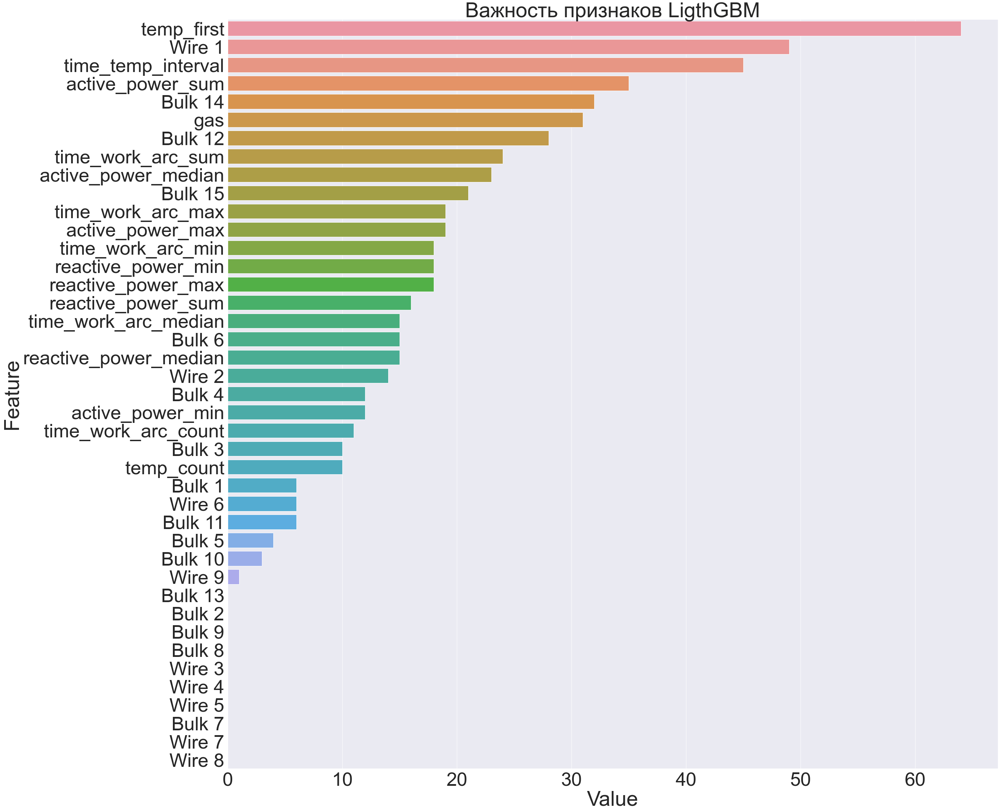

In [64]:
plot_feature_impotance(ligthboost_best_model,X_train.columns,title='Важность признаков LigthGBM')

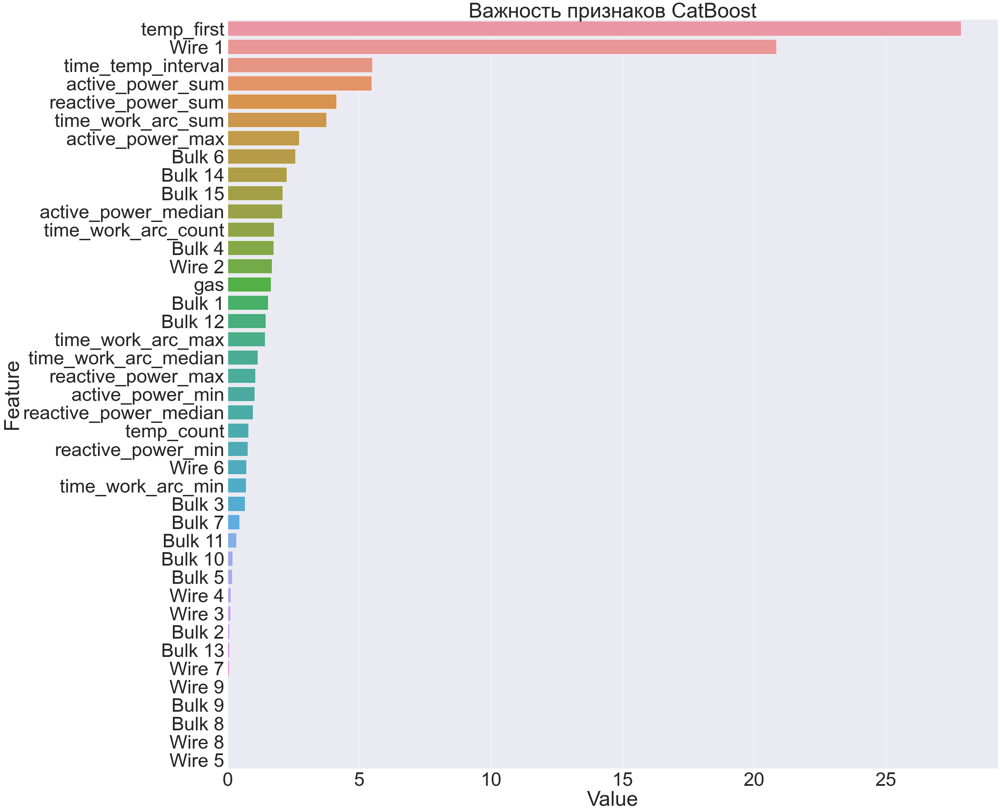

In [65]:
plot_feature_impotance(model_CatBoost,X_train.columns,title='Важность признаков CatBoost')

<a id='section2.7'></a>
## 2.7 Матрица корреляции и анализ на мультиколинеарность признаков

Т.к. признаков много, разобъем матрицу корреляции на показатели тех.процесса и лигирующие материалы

In [66]:
# проведем подготовку
# столбец temp_last поставим первым
data_all_columns = data_all.columns.to_list()
data_all_columns.remove('temp_last')
data_all_columns = ['temp_last'] + data_all_columns
data_all = data_all[data_all_columns]
# выделим столбцы с лигирующими добавками
columns_matirals = data_bulk.columns.to_list() + data_wire.columns.to_list() + ['gas']
columns_matirals = [x for x in columns_matirals if x!='key']

Матрица корреляции для показателей технологического процесса


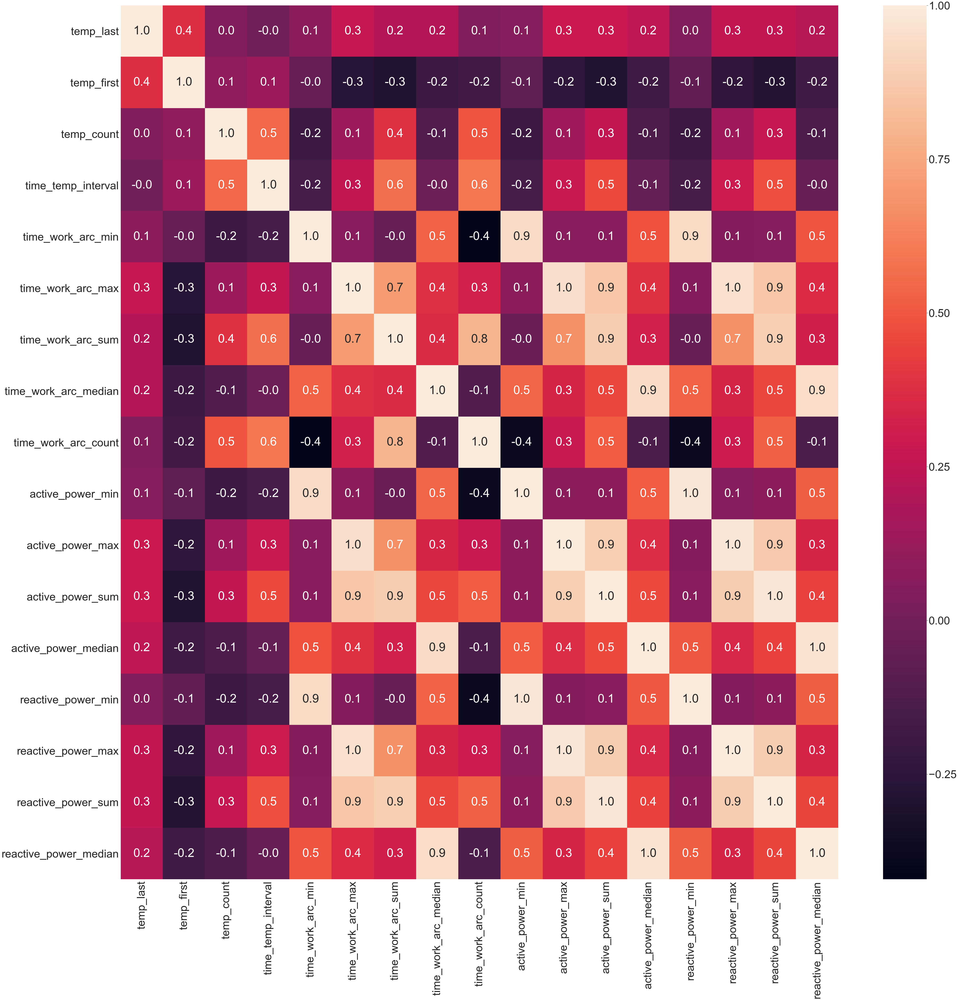

In [67]:
print("Матрица корреляции для показателей технологического процесса")
matrix_corr = data_all.drop(columns_matirals,axis=1).corr()
fig, ax = plt.subplots(figsize=(80,80))
sns.heatmap(matrix_corr, annot=True, fmt=".1f",ax=ax)
plt.show()

In [68]:
columns_matirals = ['temp_last'] + columns_matirals

Матрица корреляции для лигирующих добавок


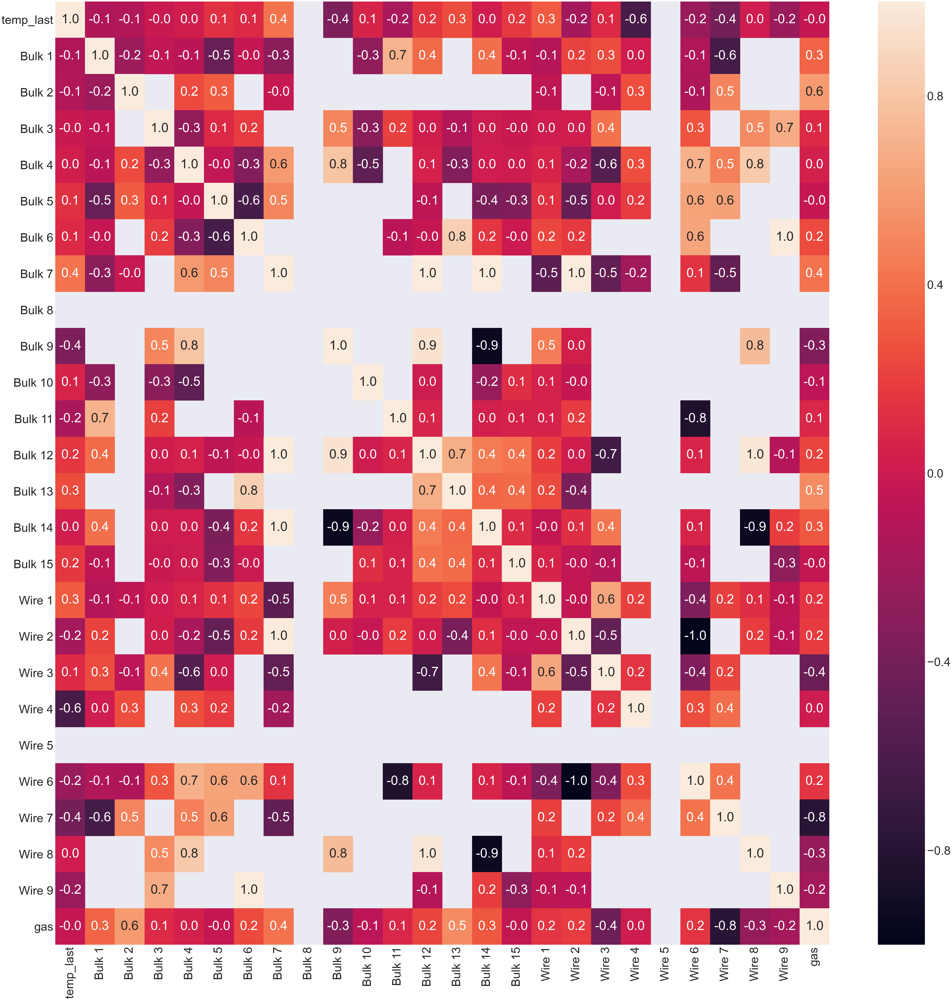

In [69]:
print("Матрица корреляции для лигирующих добавок")
matrix_corr = data_all[columns_matirals].corr()
fig, ax = plt.subplots(figsize=(80,80))
sns.heatmap(matrix_corr, annot=True, fmt=".1f",ax=ax)
plt.show()

Проанализируем корреляции между признаками. Корреляции между лигирующими добавками, анализировать не будем, т.к. не зная их химический состав сложно делать предположения о природе корреляции. А вот корреляции между физическими параметрами процесса, можно отобрать и попробовать перестроить модель удалив "лишнние" - сильно коррелированные признаки.

In [70]:
# матрица корреляции только по физическим признакам, пропуски заполним нулями, для сортировки сделаем все 
# коээфициенты положительными
series_corr = (
    data_all
    .drop(columns_matirals,axis=1)
    .corr()
    .fillna(0)
    .abs()
    .unstack()
    .sort_values(kind="quicksort")
)
#отбирем только сильно коррелированные пары
series_corr = series_corr[(series_corr>=0.8) & (series_corr!=1.0)].reset_index()
#так как пары фактически задваивают нам таблицу, выберем через одну
corr_features = series_corr[::2]['level_0'].unique()
corr_features

array(['reactive_power_sum', 'time_work_arc_max', 'reactive_power_max',
       'active_power_sum', 'time_work_arc_min', 'active_power_min',
       'time_work_arc_median', 'reactive_power_median',
       'active_power_max'], dtype=object)

Переобучим модель CatBoost и посмотрим на результаты

In [71]:
%%time
model_cat_boost = CatBoostRegressor(loss_function='MAE')
grid = {
        'learning_rate': [0.01,0.05, 0.1],
        'depth': [2,4,6]
        }

randomized_search_result = model_cat_boost.randomized_search(grid,
                                                   X=X_train.drop(corr_features,axis=1),
                                                   y=y_train,
                                                   partition_random_seed=42,
                                                   plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))


bestTest = 7.476349297
bestIteration = 999

0:	loss: 7.4763493	best: 7.4763493 (0)	total: 1.03s	remaining: 8.24s

bestTest = 6.197166994
bestIteration = 999

1:	loss: 6.1971670	best: 6.1971670 (1)	total: 2.08s	remaining: 7.29s

bestTest = 6.198594457
bestIteration = 995

2:	loss: 6.1985945	best: 6.1971670 (1)	total: 3.11s	remaining: 6.22s

bestTest = 7.278087509
bestIteration = 999

3:	loss: 7.2780875	best: 6.1971670 (1)	total: 4.93s	remaining: 6.17s

bestTest = 6.733113225
bestIteration = 999

4:	loss: 6.7331132	best: 6.1971670 (1)	total: 6.8s	remaining: 5.44s

bestTest = 6.600337388
bestIteration = 951

5:	loss: 6.6003374	best: 6.1971670 (1)	total: 8.71s	remaining: 4.35s

bestTest = 9.092359732
bestIteration = 999

6:	loss: 9.0923597	best: 6.1971670 (1)	total: 11.7s	remaining: 3.34s

bestTest = 9.355661308
bestIteration = 956

7:	loss: 9.3556613	best: 6.1971670 (1)	total: 14.8s	remaining: 1.85s

bestTest = 9.278401657
bestIteration = 928

8:	loss: 9.2784017	best: 6.1971670 (1)	total

In [72]:
# обучим модель с полным тренировочным датасетом
model_cat_boost.fit(X_train.drop(corr_features,axis=1),y_train,verbose=False)
print('CatBoost с подбором гиперпараметров:',model_cat_boost.get_params())
df_scores = calc_MAE(model_cat_boost,X_train.drop(corr_features,axis=1),
         y_train,X_test.drop(corr_features,axis=1),y_test,
         df_scores,'CatBoost финал'
        )

CatBoost с подбором гиперпараметров: {'loss_function': 'MAE', 'depth': 2, 'learning_rate': 0.05}
Модель -  <catboost.core.CatBoostRegressor object at 0x0000014085271E10>
MAE на обучнии = 4.9512, MAE на тесте = 5.8592


Мы уменьшили переобучение без потери качества метрики! Это позволяет надеятся, что модель будет работать стабильно и на других данных.

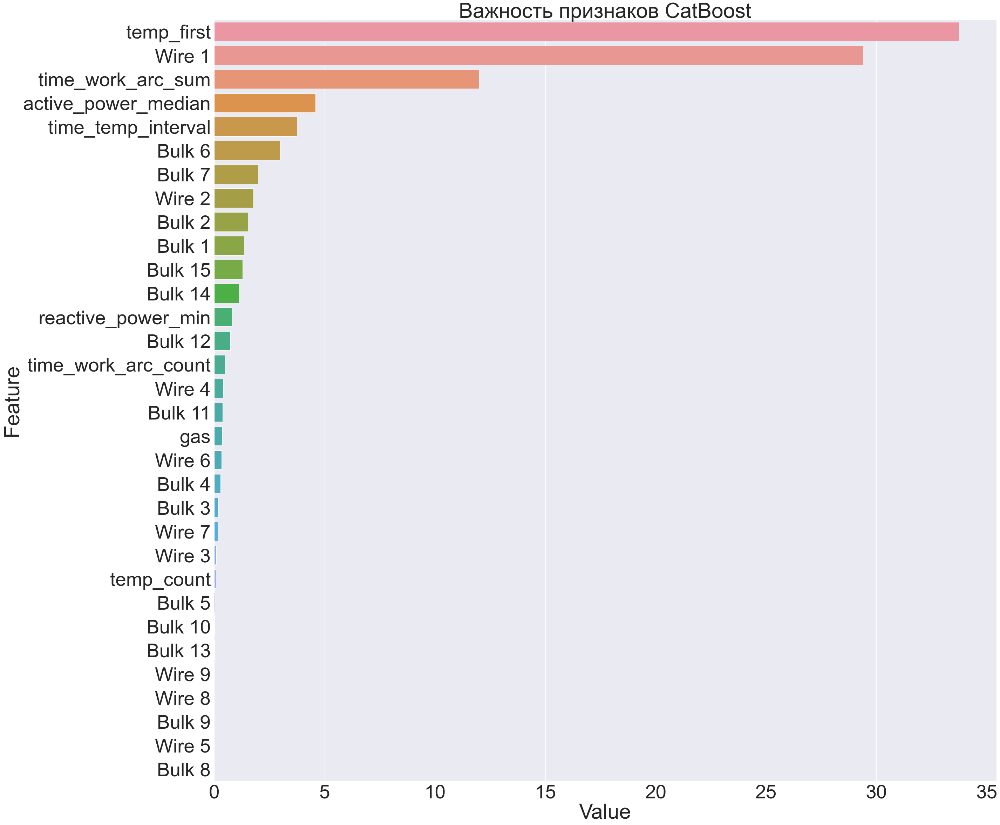

In [73]:
plot_feature_impotance(model_cat_boost,X_train.drop(corr_features,axis=1).columns,title='Важность признаков CatBoost')

<a id='section2.8'></a>
## 2.8 Анализ моделей 

В проекте были опробованны три модели машиного обучения:
- модель линейной регрессии с L2 регуляризацией, парамерт alpha=14.0 Модель обучается быстро, переобучение нет. Однако метрика всего лишь 7.12.
- Модель бустинга LightGBM из коробки показывает хорошую метрику 5.85, однако заметен эффект переобучения. Подбор параметров позволил немного уменьшить переобучения, но и ухудшил метрику. Обучается модель достаточно быстро.
- Модель бустинга CatBoost из коробки показывает лучшею метрику 5.7. После подбора гиперпараметров эффект переобучения удалось уменьшить, без существенной потери качества на тесте. Данная модель обучалась дольше всех, однако по метрике она выигрывает. Будем рекомендовать ее для дальнешего исследования.

<br>
Анализ признаков у моделей бустингов показал:

- наибольшее значение для целевой переменной имеет первое измерение температуры
- также обе модели выделяют в числе выжных признаков: интервал между измерениями температуры, суммарную активную мощность и количество лигирующей добавки Wire 1.

<br>
Матрица корреляции также подтверждает высокую корреляцию целевой переменной с первым измерением температуры. Кроме этого, можно отметить, что матрица корреляции показывает, как целевая переменная может неплохо коррелировать с другими лигирующими добавками. Текущие модели не выделяют в важные признаки большинство лигирующих добавок, например Wire 4, которые показывают неплохую корреляцию с таргетом (вероятно потому что данных мало). Можно попробовать сгенерировав новые признаки, например добавить признак "Есть Wire 4", для улучшения качества моделей.

С помощью матрицы корреляции мы поборолись с мультиколлениарностью признаков, заметно уменьшив переобучение модели (без потери качества), тем самым повысив стабильность метрики полученной на тесте.

<br> Для дальнейшего развития данной задачи, мы бы рекомендовали модели бустинга (например CatBoost), т.к. их использование показывает хорошую метрику качества, модели интерпретируемые, а так же у них есть потенциал улучшения.

<a id='section3'></a>
# 3 Отчет по проекту

В процессе работы над проектом мы столкнулись со следющими проблемами, не входящие в первоначальный план:
- анализ временных меток выявил проблемы с данными по температуре, было много данных (около 23%) в которых было одно измерение температуры. В подавляющем большинстве данных (97% данных) данные о первой измеренной температуре указаны уже после первого включения электродов. Командой было принято решение, считать ошибочными данные с одним измерением температуры, а данные о первом измерении температуры принимаем без учета времени включения электродов.
- при построении матрицы корреляции были выявлены множество мультиколлениарных признаков, что потребовало дополнительного анализа.
- модели бустинга из коробки показывали большое переобучение, пришлось проводить поиск оптимальных параметров по сетке. 
- при подборе гиперпараметров для моделей CatBoost столкнулись с тем, что некоторые параметры, например n_iterations сильно замедляет поиск по сетке, без существенного увеличения качества. Было решено оставить гиперпараметры, которые не замедляют поиск по сетке, но заметно влияют на качество.

В процессе работы над проектом были решены следующие задачи:
- проведен первичный анализ данных, исследованны выбросы. Исследованны временные метки ключевых параметров и найдены не соответствия в данных.
- Данные были объединены из нескольких таблиц и подготовлены к обучению. Сгенерированны новые признакb на базе статистик (min, max, median, count) и временных интервалов технологических процессов.
- Были выбраны три класса моделей машинного обучения: линейная регрессия (как самое простое и быстрое решение) и 2 модели бустинга (как наиболее перспективный класс моделей для решения подобного рода задач).
- Итоговые метрики моделей (см. в таблицу ниже): модель линейной регрессии показала удовлетворительные  результаты по метрике и отсутствие переобучения. Модели бустинга показали лучшие метрики, но сильное переобучение. 
- Чтобы побороться с переобучением мы применили подбор гиперпараметров модели по сетке, а также проанализировали признаки на мультиколлениарность.
- Лучшей моделью была признана модель CatBoost с итоговой метрикой МАЕ = 5.8592 на отложенной тестовой выборке.
- Анализ важности признаков позволил интерпретировать модель и выделить основные признаки, которые влияют на целевую переменную. Что в свою очередь позволяет нам сделать предположения о возможном развитии данной задачи, путем: верификации сбора данных по основным признакам, введение в модель экспертиз по влиянию лигирующих добавок на целевую переменную, увеличение объема обучающей выборки.

In [74]:
print('Таблица Модель VS Метрики')
df_scores

Таблица Модель VS Метрики


,comment,model,MAE_train,MAE_test
0,Линейная регрессия,Ridge(alpha=14.0),7.214013,7.120775
1,LGBMRegressor из коробки,"LGBMRegressor(metric='mae', random_state=42)",2.297391,5.834022
2,LGBMRegressor с подбором гиперпараметров,"LGBMRegressor(learning_rate=0.5, max_depth=4, ...",3.106434,6.246245
3,CatBoost из коробки,<catboost.core.CatBoostRegressor object at 0x0...,2.345559,5.676636
4,CatBoost с подбором гиперпараметров,<catboost.core.CatBoostRegressor object at 0x0...,4.198974,5.805898
5,CatBoost финал,<catboost.core.CatBoostRegressor object at 0x0...,4.951184,5.859172
